In [22]:
import random
import numpy as np
import matplotlib
import numba
import time
import multiprocessing as mp
from numba import jit, prange
from numba import config, njit, threading_layer
from matplotlib import pyplot as plt

In [89]:
start_time = time.time()
#random.seed(1235)
#Demand function from Klein (2020)
@njit
def demand(p1,p2):
        if p1 < p2:
            d = 1 - p1
        elif p1 == p2:
            d = 0.5 * (1 - p1)
        else:
            d = 0
        return d
    
#Price list, k= 6
x = np.array([0, 1/6, 2/6, 3/6, 4/6, 5/6, 1])
#x_cost = np.array([1, (1+1/6), (1+ 2/6), (1+ 3/6), (1+ 4/6), (1+ 5/6), (1+ 1)])

#A player picking random prices
#@numba.jit(nopython=True)
@njit
def player1(prices): 
    a = np.random.choice(prices) 
    return a

#A player picking random prices
@njit
def player2(prices): 
    b = np.random.choice(len(prices)) 
    return b


#A Q-learning player 
@njit
def player3(prices, Q, epsilon, p2):
    if random.uniform(0,1) < epsilon:
        p3 = int(np.random.choice(len(prices)))
        #print('now its random', epsilon)
    else:
        #p3, pyt = np.unravel_index(np.argmax(Q),Q.shape)
        p3 = int(np.argmax(Q[:,p2]))
    return p3

#A Q-learning player 
@njit
def player4(prices, Q, epsilon, prev):
    
    if random.uniform(0,1) < epsilon:
        p4 = int(np.random.choice(len(prices)))
        #print('now its random', epsilon)
    else:
        p4 = int(np.argmax(Q[:,prev[0,1]]))
    #print('type:', type(p4))
    return p4

#A restricted Q-learning player 
@njit
def player5(prices, Q, epsilon, prev):
    if random.uniform(0,1) < epsilon:
        p4 = np.random.choice(len(prices))
        #print('now its random', epsilon)
    else:
        p4 = np.argmax(Q[:,prev[0,1]])
        if p4 > prev[0,1]:
            p4 = prev[0,1]
        elif p4 == 0:
            p4 = p4 + 1
    return p4

#A sticky price restricted Q-learning player 
@njit
def player6(prices, Q, epsilon, prev):
    if random.uniform(0,1) < epsilon:
        p4 = np.random.choice(len(prices))
        #print('now its random', epsilon)
    else:
        p4 = np.argmax(Q[:,prev[0,1]])
        if random.uniform(0,1) < 0.5:
            p4 = prev[1,1]
    return p4

#A tit for tat player
@njit
def tit4tat(prev):
    pt = prev[0,1]
    return pt

@njit
def gamma_player(prices, Q, epsilon, prev):
    if random.uniform(0,1) < epsilon:
        p4 = np.random.choice(len(prices))
        #print('now its random', epsilon)
        if p4 == len(prices)-1:
            p4 -= 1
        elif p4 == 0:
            p4 = p4 + 1
    else:
        p4 = np.argmax(Q[:,prev[0,1]])
        if p4 == len(prices)-1:
            p4 -= 1
        elif p4 == 0:
            p4 = p4 + 1  
    return p4

@njit
def pavlov_player(prices, Q, epsilon, prev, t):
    if t < 250000:
        if prev[0,1] == 3:                                    
            p4 = 3
        else:
            p4 = 0
    else:
        if random.uniform(0,1) < epsilon:
            p4 = int(np.random.choice(len(prices)))
        else:
            p4 = int(np.argmax(Q[:,prev[0,1]]))
    return p4       
        

#Function updating the Q table of a player. 
@njit
def update(Q, prev, alpha, delta, prices, indic):
    if indic == 1: 
        p1 = prices[prev[0,0]]
        p2 = prices[prev[1,0]]
        p22 = prices[prev[1,1]]
        pe1 = Q[prev[0,0],prev[1,0]]
        ne1 = p1*demand(p1,p2) + delta* p1*demand(p1,p22) + delta**2 * Q[np.argmax(Q[:,prev[1,1]]),prev[1,1]]
        Q[prev[0,0], prev[1,0]] = (1-alpha) * pe1 + alpha * ne1
        #print('GAME player 1 ne and pe', ne1, pe1)
    else: 
        p1 = prices[prev[1,0]]
        p2 = prices[prev[0,0]]
        p22 = prices[prev[0,1]]
        pe2 = Q[prev[1,0],prev[0,0]]
        ne2 = p1*demand(p1,p2) + delta* p1*demand(p1,p22) + delta**2 * Q[np.argmax(Q[:,prev[0,1]]),prev[0,1]]
        Q[prev[1,0], prev[0,0]] = (1-alpha) * pe2 + alpha * ne2
        
@njit
def present_update(Q, prev, alpha, prices):
    p1 = prices[prev[1,0]]
    p2 = prices[prev[0,0]]
    p22 = prices[prev[0,1]]
    pe2 = Q[prev[1,0],prev[0,0]]
    ne2 = p1*demand(p1,p2)  
    Q[prev[1,0], prev[0,0]] = (1-alpha) * pe2 + alpha * ne2

#Function determining profit
@njit    
def profit(pris1, pris2):
    return pris1*demand(pris1,pris2)


In [123]:
@njit
def game(prices, periods, alpha, theta, delta):
    a = len(prices)
    Q_table = np.zeros((a, a))
    Q_table2 = np.zeros((a, a))
    optimality = 0.0
    #print('CHECK', int(periods/2)-1, 'starting a run with ', periods, ' periods')
    p_ipriser =np.zeros(int(periods/2)-1)
    p_jpriser =np.zeros(int(periods/2)-1)
    prev_p = np.zeros((2,2),dtype=numba.int64)
    prof_arr = np.zeros(int(periods-2))
    prof_arr2 = np.zeros(int(periods-2))

    for i in range(1):
        for j in range(1):
            prev_p[i,j] = np.random.choice(len(prices))
    t = 3
    i_counter = 0
    j_counter = 0
    stepsize = periods/50
    step_counter = 0
    opt_arr = np.zeros(int(periods/2/5000-1))
    b = 0
    unchanged = 0
    change1 = np.zeros(len(prices))
    change2 = np.zeros(len(prices))
    temp_br1 = np.zeros(len(prices))
    temp_br2 = np.zeros(len(prices))
    for t in range(t, periods+1):
        epsilon = (1-theta)**t
    
        if t % 2 != 0: 
            update(Q_table, prev_p, alpha, delta, prices,1)
            p_i = player3(prices, Q_table, epsilon, prev_p[1,1])
            #forced deviation
            # if t == 485001 and np.all(prev_p == 3): 
            #     print('im deviating!!!')
            #     p_i = prev_p[1,1]-1
            #     unchanged = 1
            prev_p[0,0] = prev_p[0,1]
            prev_p[0,1] = p_i
            prev_p[1,0] = prev_p[1,1]
            p_ipriser[i_counter] = (prices[p_i])
            i_counter += 1
            #print('Spiller 1 tur: p:', prices[p_i],' p_j: ', prices[prev_p[1,1]],'iteration:', t,'Q_table: \n', Q_table)
            prof_arr2[t-3] = profit(prices[prev_p[1,1]], prices[p_i])
            prof_arr[t-3] = profit(prices[prev_p[0,1]], prices[prev_p[1,1]])
            '''
            if step_counter == stepsize:
                    #print("t and stepsize", t-3, stepsize)
                    opt_arr[b] = opti(Q_table, Q_table2, prev_p[1,1], prev_p[0,1], prices, alpha, delta, theta, t)
                    step_counter = 0
                    b += 1
            step_counter +=1
            '''
                
                
      
        else: 
            update(Q_table2, prev_p, alpha, delta, prices, 0)
            #present_update(Q_table2, prev_p, alpha, prices)
            #p_j = tit4tat(prev_p)
            p_j = pavlov_player(prices, Q_table2, epsilon, prev_p, t)
            #p_j = player3(prices, Q_table2, epsilon, prev_p[0,1])
            #p_j = player6(prices, Q_table2, epsilon, prev_p)
            #p_j = gamma_player(prices, Q_table2, epsilon, prev_p)
            #p_j = player6(prices, Q_table2, epsilon, prev_p)
            #p_j = player4(prices, Q_table2, epsilon, prev_p)
            prev_p[1,0] = prev_p[1,1]
            prev_p[1,1] = p_j
            prev_p[0,0] = prev_p[0,1]
            p_jpriser[j_counter] = (prices[p_j])
            j_counter += 1
            #print('Spiller 2 tur: p:', prices[p_j], 'p_i', prices[prev_p[0,1]],' iteration: ', t,'Q_table2: \n', Q_table2)
            prof_arr[t-3] = profit(prices[prev_p[0,1]], prices[p_j])
            prof_arr2[t-3] = profit(prices[p_j], prices[prev_p[0,1]])
            #step_counter +=1
            
        '''     
        if t == 400000:
            for i in range(len(prices)):
                change1[i] = int(np.argmax(Q_table[:,i]))
                change2[i] = int(np.argmax(Q_table2[:,i]))
        elif t > 400000:
            for i in range(len(prices)):
                temp_br1[i] = int(np.argmax(Q_table[:,i]))
                temp_br2[i] = int(np.argmax(Q_table2[:,i]))
            if (np.array_equal(temp_br1,change1) == False) or (np.array_equal(temp_br2,change2) == False):
                unchanged = 1
                #print('first check', (np.array_equal(temp_br1,change1) == False), temp_br1, change1)
                #print('second check',(np.array_equal(temp_br2,change2) == False), temp_br2, change2)
        '''        
    #print('argmax arrays', temp_br1, change1,(np.array_equal(temp_br1,change1) == False) )
    #print('argmax arrays', temp_br2, change2, (np.array_equal(temp_br2,change2) == False))
                
    #optimality = opti(Q_table, p_j, p_i, prices, alpha, 0.95)
    #print ('B', b)
    
    #print('q_table2', Q_table2)
    return prof_arr, p_ipriser, p_jpriser, Q_table, opt_arr, prof_arr2, Q_table2



#@numba.jit(nopython=True)     
'''def rep_games(reps): 
    i=0
    pro_arr=np.zeros(reps)   
    while i < reps:
        print('current i:', i)
        pro, p1, p2 = game( x, 1000, 0.3, 0.01372)
        u = (1/reps)*pro
        pro_arr[i] = u
        i+=1
    return pro_arr, p1, p2'''


#simulating multiple runs and averaging profit
#@njit
def many_games(prices, periods, alpha, theta, learners,delta):
    total_pro_arr = np.zeros((learners,periods-2),dtype=np.ndarray)
    total_pro_arr2 = np.zeros((learners,periods-2),dtype=np.ndarray)
    total_opt_arr = np.zeros((learners, 49), dtype = np.ndarray)
    avg_profit = np.zeros(learners)
    avg_profit2 = np.zeros(learners)
    change_arr = np.zeros((1,25))
    change_arr2 = np.zeros((1,25))
    for i in range(learners):
        print('run #',i+1 ,'of ', learners , 'runs')
        proi, arri, arr1i, Q_ti, arr_opt_i, proi2, changes = game(prices, periods, alpha, theta, delta)
        total_pro_arr[i] = proi
        total_pro_arr2[i] = proi2
        total_opt_arr[i] = arr_opt_i
        avg_profit[i] = np.mean(proi[-10000:])
        avg_profit2[i] = np.mean(proi2[-10000:])
        #print('changes=', changes)
        # if changes == 1:
        #     print('Her er proi i udvalgte', proi[484991:485016:1]) 
        #     change_arr = np.vstack((change_arr, proi[484991:485016:1]))
        #     change_arr2 = np.vstack((change_arr2, proi2[484991:485016:1]))
        #print('avg profit firm 1 & 2', avg_profit, avg_profit2, 'længde', len(avg_profit2))
        #print('profitability1',proi[-10:])
        #print('profitability1',proi2[-10:])
        #print('pris1:', arri[-10:])
        #print('priser2:', arr1i[-10:])
    return total_pro_arr, total_opt_arr, total_pro_arr2, avg_profit, avg_profit2, change_arr, change_arr2


In [113]:
def moving_avg(fst_arr, snd_arr, window_size):

    moving_averages = []
    moving_averages2 = []
    i = 0
    while i < len(fst_arr) - window_size + 1:
    
        # Calculate the average of current window
        window_average = np.sum(fst_arr[
        i:i+window_size]) / window_size
        window_average2 = np.sum(snd_arr[
        i:i+window_size]) / window_size
        
        # Store the average of current
        # window in moving average list
        moving_averages.append(window_average)
        moving_averages2.append(window_average2)

        
        # Shift window to right by one position
        i += 1
    return moving_averages, moving_averages2

def prof_means(prof_arr1, prof_arr2):
    return np.mean(prof_arr1, axis=0), np.mean(prof_arr2, axis=0)


  Q TABLE 3 [[1.69032424 0.         1.32780974 1.83620717 1.24770374 1.25546867
  1.2403822 ]
 [1.69032424 0.         0.         2.01364443 0.         0.
  0.        ]
 [1.69032424 0.         0.         1.99497353 0.         0.
  0.        ]
 [2.26390296 0.         0.         2.5        0.         0.
  0.        ]
 [1.69032424 0.         0.         1.80083766 0.         0.
  0.        ]
 [1.69032424 0.         0.         1.84048387 0.         0.
  0.        ]
 [1.69032424 0.         0.         1.83544993 0.         0.
  0.        ]]
  Q TABLE 4 [[2.21569603 1.60166626 1.60180225 0.         1.54338255 1.68569153
  1.40228714]
 [0.         0.         0.         0.         0.         0.
  0.        ]
 [0.         0.         0.         1.44279487 0.         0.
  0.        ]
 [0.         0.         0.         2.5        0.         0.
  0.        ]
 [0.         0.         0.         1.24098635 0.         0.
  0.        ]
 [0.         0.         0.         1.153715   0.         0.
  0.       

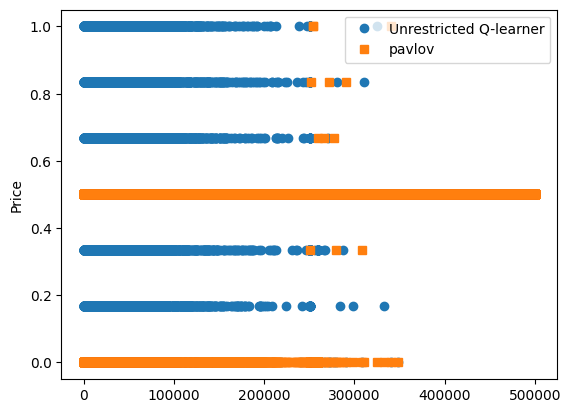

In [127]:
prof_arr, arr, arr1, q_table, bla, prof_arr2, q_4 = game(x, 500000, 0.3, 0.0000276306393827805, 0.95)

print('  Q TABLE 3', q_table)
print('  Q TABLE 4', q_4)
print('profitability',prof_arr[-10:])
t_arr1 = np.arange(0,499998,2)
t_arr2 = np.arange(1,499999,2)
print('pris1:', arr[-10:])
print('priser2:', arr1[-10:])
print(type(prof_arr))
plt.plot(t_arr1,arr,'o',label='Unrestricted Q-learner', )
plt.plot(t_arr2,arr1,'s', label='pavlov')
plt.ylabel("Price")
plt.legend(loc='upper right')
plt.show()

In [106]:
avg_prof_arr, avg_prof_arr2 = moving_avg(prof_arr, prof_arr2, 1000)
print(prof_arr, prof_arr2)
print(avg_prof_arr, avg_prof_arr2)

[0.    0.    0.    ... 0.125 0.125 0.125] [0.    0.    0.    ... 0.125 0.125 0.125]
[0.014583333333333334, 0.014583333333333332, 0.014583333333333332, 0.014583333333333334, 0.014583333333333334, 0.014583333333333332, 0.014583333333333332, 0.014583333333333334, 0.014583333333333334, 0.014583333333333332, 0.014583333333333332, 0.014583333333333332, 0.014583333333333332, 0.014583333333333332, 0.014708333333333332, 0.014708333333333332, 0.014708333333333332, 0.014708333333333332, 0.014708333333333332, 0.014708333333333332, 0.014833333333333334, 0.014833333333333334, 0.014833333333333334, 0.014833333333333334, 0.014833333333333334, 0.014833333333333334, 0.014833333333333336, 0.014833333333333334, 0.014833333333333334, 0.014833333333333334, 0.014833333333333332, 0.014833333333333334, 0.014708333333333334, 0.014708333333333332, 0.014833333333333334, 0.014958333333333336, 0.015083333333333336, 0.015305555555555555, 0.015305555555555555, 0.015305555555555557, 0.015305555555555557, 0.01530555555

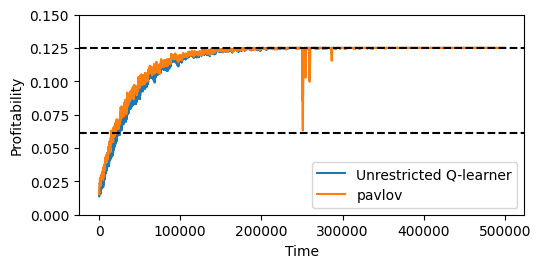

In [107]:
t_arr1 = np.arange(0,498999)
t_arr2 = np.arange(0,498999)
fig, ax = plt.subplots(figsize =(5.75, 2.6))
plt.plot(t_arr1,avg_prof_arr,'-',label='Unrestricted Q-learner')
plt.plot(t_arr2,avg_prof_arr2,'-', label='pavlov')
plt.axhline(y=0.125, color='k', linestyle = '--')
plt.axhline(y=0.061, color='k', linestyle = '--')
plt.xlabel("Time")
plt.ylabel("Profitability")
plt.ylim(0.00,0.15)
plt.legend()
plt.show()

In [124]:
many_profs, many_opt, many_profs2, delta_arr, delta_arr2, change_yes, change2 =  many_games(x, 500000, 0.3, 0.0000276306393827805, 10, 0.95)


run # 1 of  10 runs
run # 2 of  10 runs
run # 3 of  10 runs
run # 4 of  10 runs
run # 5 of  10 runs
run # 6 of  10 runs
run # 7 of  10 runs
run # 8 of  10 runs
run # 9 of  10 runs
run # 10 of  10 runs


In [125]:
samlet_prof, samlet_prof2= prof_means(many_profs, many_profs2)

time: 7714.884594917297


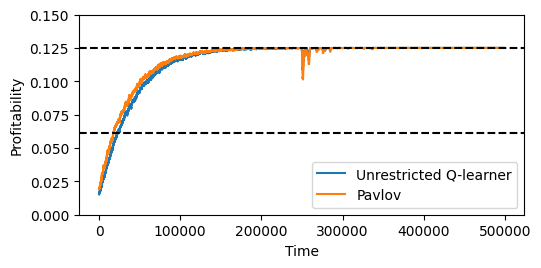

In [126]:
profitability_arr, profitability_arr2 = moving_avg(samlet_prof, samlet_prof2, 1000)
avg_timend = time.time()
#print('ending moving average. time: ', (avg_timend - avgtime))
#np.savetxt("<file>.csv", moving_averages, delimiter = ',')
#print(moving_averages)

end_time = time.time()
print('time:', end_time-start_time)

t_arr1 = np.arange(0,498999)
t_arr2 = np.arange(0,498999)
fig, ax = plt.subplots(figsize =(5.75, 2.6))
plt.plot(t_arr1,profitability_arr,'-',label='Unrestricted Q-learner')
plt.plot(t_arr2,profitability_arr2,'-', label='Pavlov')
plt.axhline(y=0.125, color='k', linestyle = '--')
plt.axhline(y=0.061, color='k', linestyle = '--')
plt.xlabel("Time")
plt.ylabel("Profitability")
plt.ylim(0.00,0.15)
plt.legend()
plt.show()

In [ ]:
t_arr1 = np.arange(0,498999)
t_arr2 = np.arange(0,498999)
fig, ax = plt.subplots(figsize =(5.75, 2.6))
plt.plot(t_arr1,profitability_arr,'-',label='Unrestricted Q-learner')
plt.plot(t_arr2,profitability_arr2,'-', label='Sticky price')
plt.axhline(y=0.125, color='k', linestyle = '--')
plt.axhline(y=0.061, color='k', linestyle = '--')
plt.xlabel("Time")
plt.ylabel("Profitability")
plt.ylim(0.00,0.15)
plt.legend()
plt.show()

In [5]:


def delta_prof(avg_array1, avg_array2):
    together_array = np.vstack((avg_array1, avg_array2))
    together_array = np.mean(together_array, axis=0)
    delta_1 = np.zeros(len(together_array))
    for i in range(len(together_array)):
        delta_1[i] = ((together_array[i]) / (0.125))
    return delta_1
    



#Function needed to determine the profit of the last 1000 runs - heatmap
def end_prof(p1_prof, p2_prof):
    end_prof1 = np.mean(np.array(([i[-1000:] for i in p1_prof])), axis=1)
    end_prof2 = np.mean(np.array(([i[-1000:] for i in p2_prof])), axis=1)
    
    return end_prof1, end_prof2, 

In [6]:
def moving_avg(fst_arr, snd_arr, window_size):

    moving_averages = []
    moving_averages2 = []
    i = 0
    while i < len(fst_arr) - window_size + 1:
    
        # Calculate the average of current window
        window_average = np.sum(fst_arr[
        i:i+window_size]) / window_size
        window_average2 = np.sum(snd_arr[
        i:i+window_size]) / window_size
        
        # Store the average of current
        # window in moving average list
        moving_averages.append(window_average)
        moving_averages2.append(window_average2)

        
        # Shift window to right by one position
        i += 1
    return moving_averages, moving_averages2


  Q TABLE 2 [[1.56868952 2.20725472 1.51975101 1.53836019 2.00121403 2.2730123
  1.98985797]
 [2.23971936 1.47443516 2.67641542 1.57423842 1.93387075 2.73830967
  2.47246668]
 [1.5487005  1.44883589 1.65549643 2.14051272 1.61451862 2.19003502
  2.08334343]
 [1.48820512 1.47189759 1.97837541 1.55139828 2.66546492 2.53272281
  2.14114067]
 [1.5520305  1.4648441  1.53211059 1.55611736 1.61431719 2.26435857
  2.05337504]
 [1.22915396 1.43592854 1.78862543 1.53474565 1.83943669 2.16301185
  2.04933308]
 [1.44832182 1.44955081 1.79396864 1.54469313 1.58179719 2.14401948
  2.08442111]]
profitability [0.         0.         0.22222222 0.         0.         0.
 0.22222222 0.         0.         0.        ]
pris1: [0.33333333 0.66666667 0.33333333 0.66666667 0.33333333 0.66666667
 0.33333333 0.66666667 0.33333333 0.66666667]
priser2: [0.16666667 0.5        0.16666667 0.5        0.16666667 0.5
 0.16666667 0.5        0.16666667 0.5       ]
<class 'numpy.ndarray'>


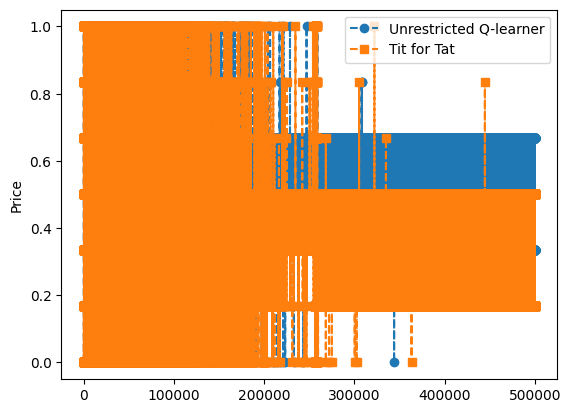

In [7]:
prof_arr, arr, arr1, q_table, bla, bla2, bl3 = game(x, 500000, 0.3, 0.0000276306393827805, 0.95)

print('  Q TABLE 2', q_table)
print('profitability',prof_arr[-10:])
t_arr1 = np.arange(0,499998,2)
t_arr2 = np.arange(1,499999,2)
print('pris1:', arr[-10:])
print('priser2:', arr1[-10:])
print(type(prof_arr))
plt.plot(t_arr1,arr,'--o',label='Unrestricted Q-learner', )
plt.plot(t_arr2,arr1,'s--', label='Tit for Tat')
plt.ylabel("Price")
plt.legend(loc='upper right')
plt.show()

starting moving averages


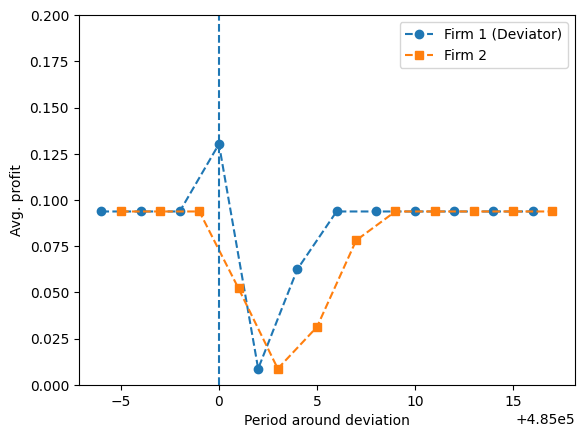

In [10]:
print('starting moving averages')
deviation_arr, deviation_arr2 = moving_avg(dev_arr, dev_arr2, 2)

deviation_t = np.arange(484994,485018, 2)
deviation_t2 = np.arange(484995,485019, 2)
deviation_arr = deviation_arr[0:24:2]
deviation_arr2 = deviation_arr2[1:25:2]
plt.plot(deviation_t, deviation_arr, '--o', label='Firm 1 (Deviator)')
plt.plot(deviation_t2, deviation_arr2, 's--', label='Firm 2')
plt.vlines(x=485000, ymin=0.00, ymax=0.2, linestyle = '--')
plt.xlabel("Period around deviation")
plt.ylabel("Avg. profit")
plt.ylim(0.00,0.2)
plt.legend()
plt.show()
